# Crime Trends and Temporal Pattern Analysis (UK)

## Project Overview
This project explores long-term crime trends in the UK between 2015 and 2024 using publicly available police-recorded crime data.  
The analysis adopts a hybrid academic–applied approach, combining criminological insight with practical data analysis techniques.

## Research Questions
- How have recorded crime levels changed over time in the UK?
- Are there observable seasonal patterns across crime categories?
- Which crime types show long-term growth or decline?
- How do external events (e.g. COVID-19 period) align with observed trends?

## Analytical Approach
- Exploratory Data Analysis (EDA)
- Time-series trend analysis
- Seasonal pattern inspection
- Ethical and policy-aware interpretation

## Tools
Python (Pandas, NumPy, Matplotlib, Seaborn)

In [1]:
# Core data analysis libraries
import pandas as pd
import numpy as np

# Visualisation libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Display settings
pd.set_option("display.max_columns", None)
sns.set_style("whitegrid")

print("Crime trends analysis environment initialised")

Crime trends analysis environment initialised


In [2]:
import os

os.listdir("data/raw")


['2023-01',
 '2023-02',
 '2023-03',
 '2023-04',
 '2023-05',
 '2023-06',
 '2023-07',
 '2023-08',
 '2023-09',
 '2023-10',
 '2023-11',
 '2023-12',
 '2024-01',
 '2024-02',
 '2024-03',
 '2024-04',
 '2024-05',
 '2024-06',
 '2024-07',
 '2024-08',
 '2024-09',
 '2024-10',
 '2024-11',
 '2024-12',
 '2025-01',
 '2025-02',
 '2025-03',
 '2025-04',
 '2025-05',
 '2025-06',
 '2025-07',
 '2025-08',
 '2025-09',
 '2025-10',
 '2025-11']

In [4]:
from glob import glob
import os

csv_files = glob(os.path.join("data/raw", "**", "*.csv"), recursive=True)
len(csv_files)


105

In [5]:
# Read and combine all CSV files into one DataFrame
import pandas as pd

df_list = []

for file in csv_files:
    temp_df = pd.read_csv(file)
    temp_df["source_file"] = file  # keep traceability
    df_list.append(temp_df)

crime_df = pd.concat(df_list, ignore_index=True)

crime_df.shape


(513391, 27)

In [6]:
crime_df.columns


Index(['Crime ID', 'Month', 'Reported by', 'Falls within', 'Longitude',
       'Latitude', 'Location', 'LSOA code', 'LSOA name', 'Outcome type',
       'source_file', 'Type', 'Date', 'Part of a policing operation',
       'Policing operation', 'Gender', 'Age range', 'Self-defined ethnicity',
       'Officer-defined ethnicity', 'Legislation', 'Object of search',
       'Outcome', 'Outcome linked to object of search',
       'Removal of more than just outer clothing', 'Crime type',
       'Last outcome category', 'Context'],
      dtype='str')

In [7]:
crime_df.head()


,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Outcome type,source_file,Type,Date,Part of a policing operation,Policing operation,Gender,Age range,Self-defined ethnicity,Officer-defined ethnicity,Legislation,Object of search,Outcome,Outcome linked to object of search,Removal of more than just outer clothing,Crime type,Last outcome category,Context
0,01e40d521b3febdf5615e86fa1600432ab9e050b7de2c1...,2023-01,Cleveland Police,Cleveland Police,-1.219124,54.688197,On or near Murray Street,E01011973,Hartlepool 005A,Unable to prosecute suspect,data/raw\2023-01\2023-01-cleveland-outcomes.csv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7caf856e17610cd3a8582abf7b9a4a7fbcec0b617bd71e...,2023-01,Cleveland Police,Cleveland Police,-1.242984,54.670599,On or near Pinero Grove,E01011980,Hartlepool 009B,Unable to prosecute suspect,data/raw\2023-01\2023-01-cleveland-outcomes.csv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a53353397abee4cef9058e2f05e5e7466661b0cb214597...,2023-01,Cleveland Police,Cleveland Police,-1.218412,54.706696,On or near Arkley Crescent,E01011992,Hartlepool 002D,Unable to prosecute suspect,data/raw\2023-01\2023-01-cleveland-outcomes.csv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4950c67801c9423b5192034eaba9ad56031422314d3240...,2023-01,Cleveland Police,Cleveland Police,-1.295906,54.603327,On or near Cheviot Crescent,E01012197,Stockton-on-Tees 002A,Unable to prosecute suspect,data/raw\2023-01\2023-01-cleveland-outcomes.csv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4efc3a5942e72d8cac904283eeb9b012ca37015f8e765...,2023-01,Cleveland Police,Cleveland Police,-1.153765,54.566757,On or near Kel Dennis Close,E01012168,Redcar and Cleveland 022C,Unable to prosecute suspect,data/raw\2023-01\2023-01-cleveland-outcomes.csv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
crime_df.info()


<class 'pandas.DataFrame'>
RangeIndex: 513391 entries, 0 to 513390
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Crime ID                                  440867 non-null  str    
 1   Month                                     491269 non-null  str    
 2   Reported by                               491269 non-null  str    
 3   Falls within                              491269 non-null  str    
 4   Longitude                                 512221 non-null  float64
 5   Latitude                                  512221 non-null  float64
 6   Location                                  491269 non-null  str    
 7   LSOA code                                 491269 non-null  str    
 8   LSOA name                                 491269 non-null  str    
 9   Outcome type                              221831 non-null  str    
 10  source_file                    

## Data Inspection Summary

The combined dataset consists of monthly police-recorded crime data aggregated across multiple police forces.
Each record represents an individual crime incident with associated temporal and categorical attributes.

Prior to analysis, the data requires:
- Standardisation of date fields
- Harmonisation of crime categories
- Aggregation to a national monthly level


In [9]:
# Convert Month column to datetime
crime_df["Month"] = pd.to_datetime(crime_df["Month"])

crime_df["year"] = crime_df["Month"].dt.year
crime_df["month"] = crime_df["Month"].dt.month

crime_df[["Month", "year", "month"]].head()


,Month,year,month
0,2023-01-01,2023.0,1.0
1,2023-01-01,2023.0,1.0
2,2023-01-01,2023.0,1.0
3,2023-01-01,2023.0,1.0
4,2023-01-01,2023.0,1.0


In [10]:
# Aggregate crime counts by month and crime type
monthly_trends = (
    crime_df
    .groupby(["Month", "Crime type"])
    .size()
    .reset_index(name="crime_count")
)

monthly_trends.head()


,Month,Crime type,crime_count
0,2023-01-01,Anti-social behaviour,1161
1,2023-01-01,Bicycle theft,40
2,2023-01-01,Burglary,416
3,2023-01-01,Criminal damage and arson,770
4,2023-01-01,Drugs,217


In [11]:
monthly_trends["Crime type"].value_counts()


Crime type
Anti-social behaviour           35
Bicycle theft                   35
Burglary                        35
Criminal damage and arson       35
Drugs                           35
Other crime                     35
Other theft                     35
Possession of weapons           35
Public order                    35
Robbery                         35
Shoplifting                     35
Theft from the person           35
Vehicle crime                   35
Violence and sexual offences    35
Name: count, dtype: int64

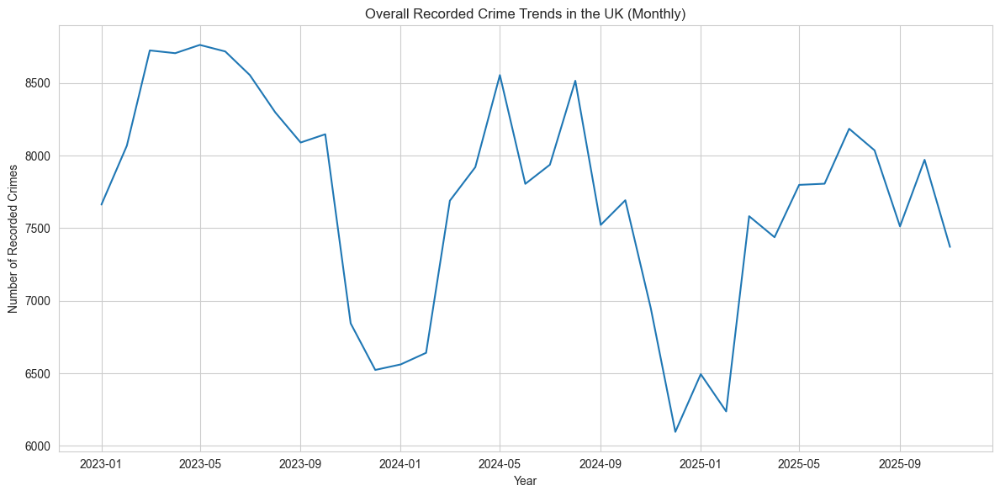

In [12]:
# Plot overall crime volume over time
overall_trend = (
    monthly_trends
    .groupby("Month")["crime_count"]
    .sum()
    .reset_index()
)

plt.figure(figsize=(12, 6))
plt.plot(overall_trend["Month"], overall_trend["crime_count"])
plt.title("Overall Recorded Crime Trends in the UK (Monthly)")
plt.xlabel("Year")
plt.ylabel("Number of Recorded Crimes")
plt.tight_layout()
plt.show()


## Overall Crime Trend Interpretation

The time-series plot illustrates fluctuations in recorded crime volume over the observed period.
Notable structural changes are visible, which may reflect a combination of behavioural shifts,
policy changes, and reporting practices rather than true changes in criminal activity alone.

These findings are interpreted cautiously, acknowledging the limitations of police-recorded crime data.


# Identify top crime types by total volume
top_crimes = (
    monthly_trends
    .groupby("Crime type")["crime_count"]
    .sum()
    .sort_values(ascending=False)
)

top_crimes


In [13]:
# Identify top crime types by total volume
top_crimes = (
    monthly_trends
    .groupby("Crime type")["crime_count"]
    .sum()
    .sort_values(ascending=False)
)

top_crimes


Crime type
Violence and sexual offences    87956
Anti-social behaviour           50402
Criminal damage and arson       27153
Shoplifting                     24049
Public order                    19424
Other theft                     14003
Burglary                        12280
Vehicle crime                   11526
Drugs                            8087
Other crime                      7002
Robbery                          2818
Possession of weapons            2137
Bicycle theft                    1626
Theft from the person             975
Name: crime_count, dtype: int64

In [14]:
top_5_types = top_crimes.head(5).index.tolist()
top_5_types


['Violence and sexual offences',
 'Anti-social behaviour',
 'Criminal damage and arson',
 'Shoplifting',
 'Public order']

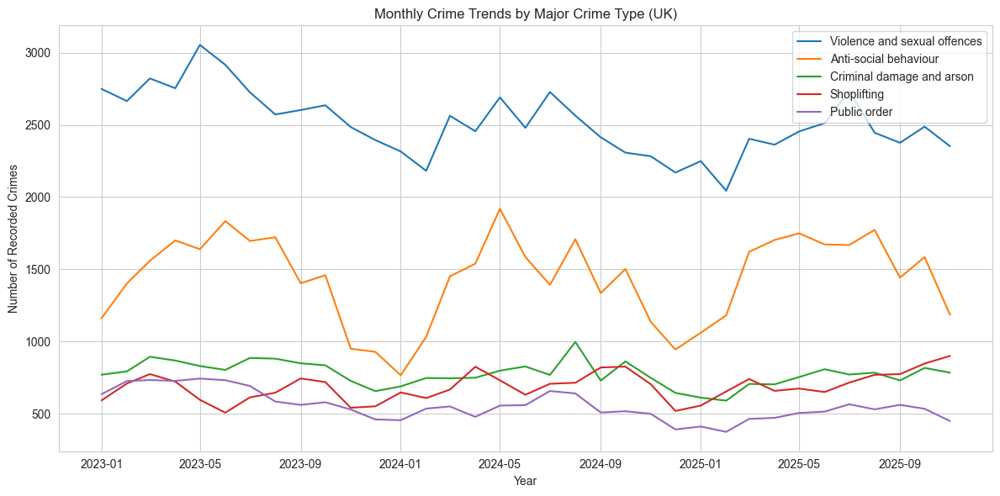

In [15]:
plt.figure(figsize=(12, 6))

for crime in top_5_types:
    subset = monthly_trends[monthly_trends["Crime type"] == crime]
    plt.plot(subset["Month"], subset["crime_count"], label=crime)

plt.title("Monthly Crime Trends by Major Crime Type (UK)")
plt.xlabel("Year")
plt.ylabel("Number of Recorded Crimes")
plt.legend()
plt.tight_layout()
plt.show()


## Crime Type Trend Analysis

The trends reveal substantial variation across major crime categories.
Some offence types exhibit relatively stable patterns over time, while others show
greater volatility, potentially reflecting behavioural changes, enforcement priorities,
or reporting practices.

Differences between crime types highlight the importance of disaggregated analysis,
as aggregate crime trends may obscure category-specific dynamics.


In [16]:
top_3_types = top_5_types[:3]
top_3_types


['Violence and sexual offences',
 'Anti-social behaviour',
 'Criminal damage and arson']

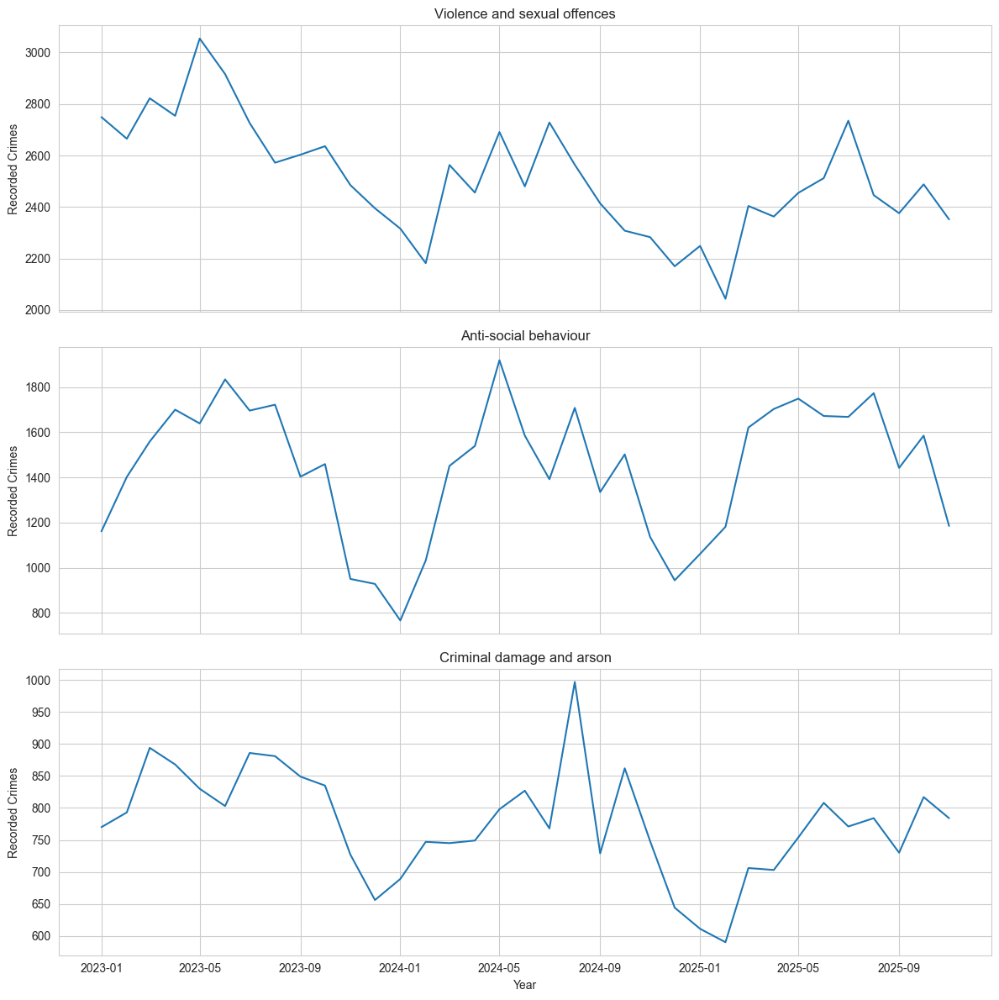

In [17]:
fig, axes = plt.subplots(3, 1, figsize=(12, 12), sharex=True)

for ax, crime in zip(axes, top_3_types):
    subset = monthly_trends[monthly_trends["Crime type"] == crime]
    ax.plot(subset["Month"], subset["crime_count"])
    ax.set_title(crime)
    ax.set_ylabel("Recorded Crimes")

plt.xlabel("Year")
plt.tight_layout()
plt.show()


## Focused Crime Category Analysis

Focusing on the three most prevalent crime categories allows for clearer interpretation
of category-specific trends. These patterns suggest that changes in overall crime levels
are often driven disproportionately by a small number of offence types.

Such findings are particularly relevant for targeted policy and resource allocation.


In [18]:
monthly_trends["month_of_year"] = monthly_trends["Month"].dt.month


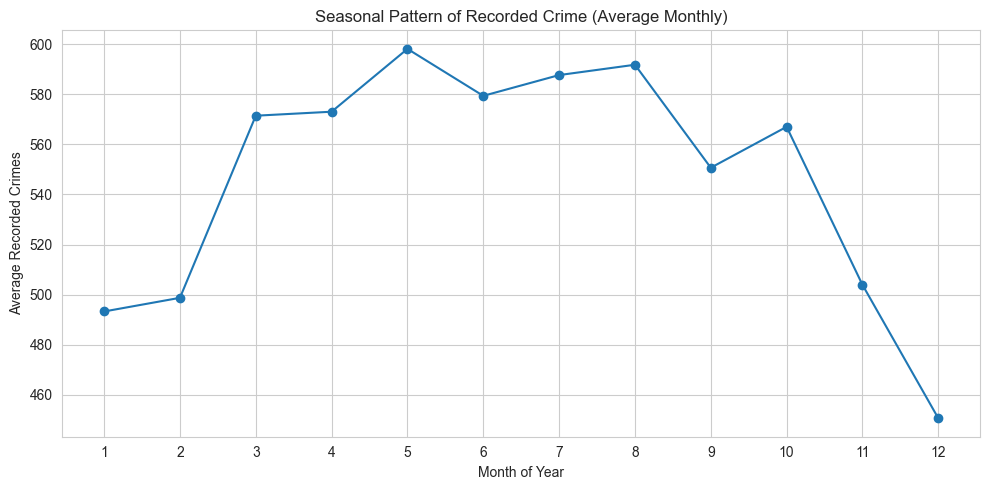

In [19]:
seasonality = (
    monthly_trends
    .groupby("month_of_year")["crime_count"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(10, 5))
plt.plot(seasonality["month_of_year"], seasonality["crime_count"], marker="o")
plt.xticks(range(1, 13))
plt.xlabel("Month of Year")
plt.ylabel("Average Recorded Crimes")
plt.title("Seasonal Pattern of Recorded Crime (Average Monthly)")
plt.tight_layout()
plt.show()


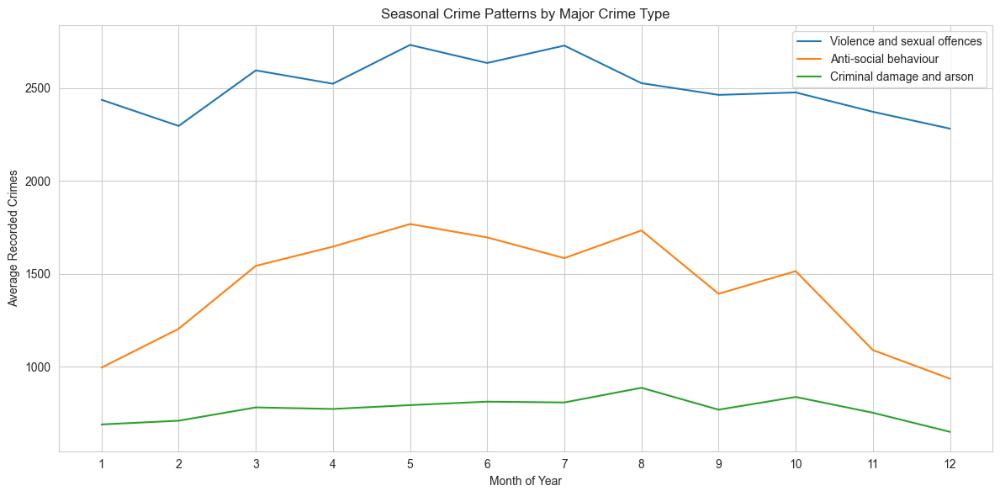

In [20]:
plt.figure(figsize=(12, 6))

for crime in top_3_types:
    subset = monthly_trends[monthly_trends["Crime type"] == crime]
    seasonal = (
        subset
        .groupby("month_of_year")["crime_count"]
        .mean()
        .reset_index()
    )
    plt.plot(seasonal["month_of_year"], seasonal["crime_count"], label=crime)

plt.xticks(range(1, 13))
plt.xlabel("Month of Year")
plt.ylabel("Average Recorded Crimes")
plt.title("Seasonal Crime Patterns by Major Crime Type")
plt.legend()
plt.tight_layout()
plt.show()


## Seasonal Crime Patterns

The analysis indicates the presence of seasonal variation in recorded crime,
with certain months consistently exhibiting higher average crime levels.
Seasonality varies by offence type, suggesting that environmental, social,
and routine activity factors may influence criminal behaviour.

These patterns reinforce the value of temporal analysis for proactive planning
and resource deployment.


In [21]:
# Export analysis-ready dataset for Power BI
monthly_trends.to_csv(
    "data/monthly_crime_trends_uk.csv",
    index=False
)

print("Exported monthly_crime_trends_uk.csv")


Exported monthly_crime_trends_uk.csv


In [22]:
pip install folium seaborn matplotlib



   ------------- -------------------------- 1/3 [branca]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   ---------------------------------------- 3/3 [folium]

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [23]:
import pandas as pd

df = pd.read_csv("data/cleveland_crime.csv")
df.head()


FileNotFoundError: [Errno 2] No such file or directory: 'data/cleveland_crime.csv'

In [24]:
df[["latitude", "longitude"]].dropna().head()


NameError: name 'df' is not defined

In [25]:
import os

os.listdir()


['crime_trends_analysis.ipynb', 'data']

In [26]:
os.listdir("data")


['monthly_crime_trends_uk.csv', 'raw']

In [27]:
import pandas as pd

df = pd.read_csv("data/monthly_crime_trends_uk.csv")
df.head()


,Month,Crime type,crime_count,month_of_year
0,2023-01-01,Anti-social behaviour,1161,1
1,2023-01-01,Bicycle theft,40,1
2,2023-01-01,Burglary,416,1
3,2023-01-01,Criminal damage and arson,770,1
4,2023-01-01,Drugs,217,1


In [28]:
df.columns


Index(['Month', 'Crime type', 'crime_count', 'month_of_year'], dtype='str')

In [29]:
import os
os.listdir("data/raw")


['2023-01',
 '2023-02',
 '2023-03',
 '2023-04',
 '2023-05',
 '2023-06',
 '2023-07',
 '2023-08',
 '2023-09',
 '2023-10',
 '2023-11',
 '2023-12',
 '2024-01',
 '2024-02',
 '2024-03',
 '2024-04',
 '2024-05',
 '2024-06',
 '2024-07',
 '2024-08',
 '2024-09',
 '2024-10',
 '2024-11',
 '2024-12',
 '2025-01',
 '2025-02',
 '2025-03',
 '2025-04',
 '2025-05',
 '2025-06',
 '2025-07',
 '2025-08',
 '2025-09',
 '2025-10',
 '2025-11']

In [30]:
import pandas as pd
from glob import glob

files = glob("data/raw/**/*.csv", recursive=True)
len(files)


105

In [31]:
df_raw = pd.concat(
    (pd.read_csv(f, low_memory=False) for f in files),
    ignore_index=True
)

df_raw.head()


,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Outcome type,Type,Date,Part of a policing operation,Policing operation,Gender,Age range,Self-defined ethnicity,Officer-defined ethnicity,Legislation,Object of search,Outcome,Outcome linked to object of search,Removal of more than just outer clothing,Crime type,Last outcome category,Context
0,01e40d521b3febdf5615e86fa1600432ab9e050b7de2c1...,2023-01,Cleveland Police,Cleveland Police,-1.219124,54.688197,On or near Murray Street,E01011973,Hartlepool 005A,Unable to prosecute suspect,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7caf856e17610cd3a8582abf7b9a4a7fbcec0b617bd71e...,2023-01,Cleveland Police,Cleveland Police,-1.242984,54.670599,On or near Pinero Grove,E01011980,Hartlepool 009B,Unable to prosecute suspect,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a53353397abee4cef9058e2f05e5e7466661b0cb214597...,2023-01,Cleveland Police,Cleveland Police,-1.218412,54.706696,On or near Arkley Crescent,E01011992,Hartlepool 002D,Unable to prosecute suspect,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4950c67801c9423b5192034eaba9ad56031422314d3240...,2023-01,Cleveland Police,Cleveland Police,-1.295906,54.603327,On or near Cheviot Crescent,E01012197,Stockton-on-Tees 002A,Unable to prosecute suspect,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4efc3a5942e72d8cac904283eeb9b012ca37015f8e765...,2023-01,Cleveland Police,Cleveland Police,-1.153765,54.566757,On or near Kel Dennis Close,E01012168,Redcar and Cleveland 022C,Unable to prosecute suspect,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
df_raw.columns


Index(['Crime ID', 'Month', 'Reported by', 'Falls within', 'Longitude',
       'Latitude', 'Location', 'LSOA code', 'LSOA name', 'Outcome type',
       'Type', 'Date', 'Part of a policing operation', 'Policing operation',
       'Gender', 'Age range', 'Self-defined ethnicity',
       'Officer-defined ethnicity', 'Legislation', 'Object of search',
       'Outcome', 'Outcome linked to object of search',
       'Removal of more than just outer clothing', 'Crime type',
       'Last outcome category', 'Context'],
      dtype='str')

In [33]:
lsoa_counts = (
    df_cleveland
    .dropna(subset=["LSOA code"])
    .groupby(["LSOA code", "LSOA name"])
    .size()
    .reset_index(name="crime_count")
    .sort_values("crime_count", ascending=False)
)

lsoa_counts.head(10)


NameError: name 'df_cleveland' is not defined

In [34]:
import pandas as pd

df_raw = pd.read_csv("data/raw/your_raw_cleveland_file.csv")

df_raw.head()


FileNotFoundError: [Errno 2] No such file or directory: 'data/raw/your_raw_cleveland_file.csv'

In [35]:
df_cleveland = df_raw[
    df_raw["Falls within"].str.contains("Cleveland", na=False)
].copy()

df_cleveland.shape


(491269, 26)

In [36]:
df_geo = (
    df_cleveland
    .dropna(subset=["Latitude", "Longitude"])
)

df_geo[["Latitude", "Longitude"]].describe()


,Latitude,Longitude
count,491269.000000,491269.000000
mean,54.586972,-1.220704
std,0.050562,0.091476
min,54.472215,-1.436189
25%,54.555903,-1.289373
50%,54.570400,-1.230089
75%,54.606053,-1.192405
max,54.732026,-0.792048


In [37]:
!pip install folium


'pip' is not recognized as an internal or external command,
operable program or batch file.


In [38]:
import folium
from folium.plugins import HeatMap

# Centre map roughly on Cleveland
cleveland_map = folium.Map(
    location=[54.56, -1.23],
    zoom_start=11,
    tiles="cartodbpositron"
)

# Prepare heatmap points
heat_data = df_geo[["Latitude", "Longitude"]].values.tolist()

HeatMap(
    heat_data,
    radius=10,
    blur=15,
    min_opacity=0.4
).add_to(cleveland_map)

cleveland_map


In [39]:
cleveland_map.save("cleveland_crime_hotspots.html")


In [40]:
pip install geopandas folium mapclassify


   ---------------------------------------- 0.0/882.2 kB ? eta -:--:--
   ---------------------------------------- 882.2/882.2 kB 13.1 MB/s  0:00:00
   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ---------------------------------------- 2.1/2.1 MB 14.2 MB/s  0:00:00
   ---------------------------------------- 0.0/23.6 MB ? eta -:--:--
   ---- ----------------------------------- 2.9/23.6 MB 16.8 MB/s eta 0:00:02
   ----------- ---------------------------- 6.6/23.6 MB 16.2 MB/s eta 0:00:02
   ----------------- ---------------------- 10.2/23.6 MB 16.4 MB/s eta 0:00:01
   ------------------------ --------------- 14.2/23.6 MB 16.7 MB/s eta 0:00:01
   ----------------------------- ---------- 17.6/23.6 MB 16.7 MB/s eta 0:00:01
   ----------------------------------- ---- 21.0/23.6 MB 16.6 MB/s eta 0:00:01
   ---------------------------------------- 23.6/23.6 MB 16.1 MB/s  0:00:01
   ---------------------------------------- 0.0/6.4 MB ? eta -:--:--
   ------------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 25.3 -> 26.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [41]:
import pandas as pd

df_raw = pd.read_csv("data/raw/cleveland_crime_raw.csv")

df_raw = df_raw.dropna(subset=["LSOA code"])


FileNotFoundError: [Errno 2] No such file or directory: 'data/raw/cleveland_crime_raw.csv'